In [5]:
# IMPORTS GLOBAUX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import norm, f_oneway, binom, pearsonr, spearmanr
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import scipy.linalg as la

In [27]:
# Chemin du fichier
chemin_fichier = 'Airplane_Crashes_and_Fatalities_Since_1908_t0_2023.csv'

# Tentative avec différents encodages
try:
    # Essai avec 'latin-1'
    df = pd.read_csv(chemin_fichier, encoding='latin-1')
except:
    try:
        # Essai avec 'iso-8859-1'
        df = pd.read_csv(chemin_fichier, encoding='iso-8859-1')
    except:
        try:
            # Essai avec 'cp1252'
            df = pd.read_csv(chemin_fichier, encoding='cp1252')
        except Exception as e:
            print(f"Erreur lors de la lecture du fichier : {e}")

# 1.2 Display of 5 upper lines (for reminder)
print(df.head())
df.shape 
print(df.tail())
print(df.info())
print(df.shape())
print(df.columns())
print(df.index())
print(df.describe())
print(df.dtypes())
print(df.isnull().sum())
print(df.dropna())

In [ ]:
df.head()

In [ ]:
print(df.tail())

In [ ]:
print(df.info())

In [43]:
df.shape 

(4998, 17)

In [ ]:
print(df.describe())

In [48]:
print(df.isnull().sum())

Date                        0
Time                        0
Location                    0
Operator                    0
Flight #                 1968
Route                       0
AC Type                     1
Registration               61
cn/ln                     201
Aboard                      1
Aboard Passangers          20
Aboard Crew                20
Fatalities                  0
Fatalities Passangers      25
Fatalities Crew            25
Ground                      8
Summary                     3
dtype: int64


Comment : main missing values are on Flight (1968), then cn/ln (201), then registration (61), then at much lower level on Fatalities Passangers and Fatalities Crew (25 each), then Abord passenger and Abord crew (20 each), Ground (8), Summary (3), Aboard (1) and AC Type (1).
On these basis, the "Flight", "cn/ln" and "Registration" columns could be removed. Also "Route", "AC Type", "Summary" appear of limited statistical utility. These columns might be removed too. 

Flight #                 1968
Route                       0
AC Type                     1
Registration               61
cn/ln                     201
Aboard                      1
Aboard Passangers          20
Aboard Crew                20
Fatalities                  0
Fatalities Passangers      25
Fatalities Crew            25
Ground                      8
Summary                     3

In [ ]:
print(df.dropna())

In [ ]:
df.columns()

In [ ]:
df.index()

In [45]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date                   4998 non-null   datetime64[ns]
 1   Time                   3486 non-null   object        
 2   Location               4994 non-null   object        
 3   Operator               4988 non-null   object        
 4   Flight #               1329 non-null   object        
 5   Route                  4221 non-null   object        
 6   AC Type                4983 non-null   object        
 7   Registration           4724 non-null   object        
 8   cn/ln                  4330 non-null   object        
 9   Aboard                 4980 non-null   float64       
 10  Aboard Passangers      4769 non-null   float64       
 11  Aboard Crew            4772 non-null   float64       
 12  Fatalities             4990 non-null   float64       
 13  Fat

In [ ]:
#Tasks:
    #1. Data Import and Cleaning:
        # Import the dataset using Pandas (done hereabove) 
        # Clean and preprocess the data, addressing missing values and categorizing data as needed.
        # Convert dates and other relevant fields to appropriate formats.
        
        #Step 1 - dates conversion
df["Date"] = pd.to_datetime(df["Date"], errors='coerce')

In [ ]:
        #Step2 - Missing values columns treatment
            # for numerical columns with missing values, substitute mean or median to missing values :
df["Aboard"].fillna(df["Aboard"].mean(), inplace=True)
df["Aboard Passangers"].fillna(df["Aboard Passangers"].mean(), inplace=True)
df["Aboard Crew"].fillna(df["Aboard Crew"].mean(), inplace=True)

df["Fatalities Passangers"].fillna(df["Fatalities Passangers"].mean(), inplace=True)
df["Fatalities Crew"].fillna(df["Fatalities Crew"].mean(), inplace=True)
df["Ground"].fillna(0, inplace=True)  # Hypothesis : if not mentionned, no ground casualty

In [ ]:
        #Step3 - Treatment of columns with partially missing identification values 
df["Registration"].fillna("Unknown", inplace=True)
df["cn/ln"].fillna("Unknown", inplace=True)

In [62]:
        #Step 4 - numerical column conversion (from float64 to int) :
df["Fatalities"] = df["Fatalities"].astype("Int64")
#Nota : Utilize Int64 (maj) to enable missing values (NaN).

In [185]:
        #Step 5 - Retreat the Flight column # (with as much as 40% of NaN)
df.drop(columns=[col for col in df.columns if 'Flight' in col and '#' in col], inplace=True)

In [ ]:
        #Step 6 - Text column cleaning
            # Summary has got very few missing values (3). Substitute neutral text :
df["Summary"].fillna("No summary available", inplace=True)

In [172]:
        #Step 7 - add derived categories :
df["Year"] = df["Date"].dt.year
df["Month"] = df["Date"].dt.month

In [179]:
df.columns = df.columns.str.strip()  # enlève les espaces
df.columns = df.columns.str.lower()  # met en minuscules

In [ ]:
        #Step 8 - create new categories :
df["Accident_Type"] = df["Summary"].apply(lambda x: "Military" if "military" in str(x).lower() else "Civil")

Code erreur incompris : ne semble pas reconnaitre "Summary".

In [ ]:
        #Step 9 - string cleaning 
df["Operator"] = df["Operator"].str.strip().str.upper()

Code erreur incompris : ne semble pas reconnaitre "Operator".

In [ ]:
        #Step 10 - New dataframe check-up (through missing values) 
print(df.isnull().sum())

In [ ]:
#2. Exploratory Data Analysis:
    # Use Pandas to explore basic statistics such as the number of crashes, fatalities, and survival rates.
    # Analyze the frequency of crashes over time to identify any trends.

In [80]:
# IMPORTS GLOBAUX
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import norm, f_oneway, binom, pearsonr, spearmanr
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import scipy.linalg as la

In [168]:
# Here is a simulated dataframe that will be used for the purpose of the exercize, which will reflected original database after cleaning :
data = {
    "Date": pd.date_range(start="1950-01-01", periods=1000, freq="M"),
    "Fatalities": np.random.randint(0, 200, 1000),
    "Aboard": np.random.randint(50, 300, 1000),
}
df = pd.DataFrame(data)

C:\Users\cibei\AppData\Local\Temp\ipykernel_46600\635592905.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  "Date": pd.date_range(start="1950-01-01", periods=1000, freq="M"),


In [ ]:
# Date conversion to proper format :
df["Date"] = pd.to_datetime(df["Date"])

# Survival rate calculation :
df["Survivors"] = df["Aboard"] - df["Fatalities"]
df["Survival Rate (%)"] = (df["Survivors"] / df["Aboard"]) * 100

# Basic descriptive statistics :
basic_stats = df[["Fatalities", "Aboard", "Survivors", "Survival Rate (%)"]].describe()

# Adding a "Year" column for temporal analysis :
df["Year"] = df["Date"].dt.year

# Counting yearly crashes :
crashes_per_year = df.groupby("Year").size()

# Total number of crashes, aboard passengers, fatalities, survivors :
total_crashes = len(df)
total_aboard = df["Aboard"].sum()
total_fatalities = df["Fatalities"].sum()
total_survivors = df["Survivors"].sum()

df["Survivors"] = df["Aboard"] - df["Fatalities"]

# Total survivor rate :
df["Survival Rate (%)"] = (df["Survivors"] / df["Aboard"]) * 100




Survival Rate (%!)









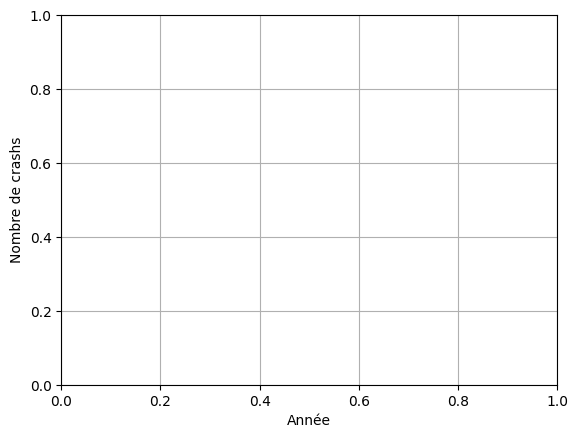

In [167]:
import matplotlib.pyplot as plt
plt.xlabel("Année")
plt.ylabel("Nombre de crashs")
plt.grid(True)
plt.show()

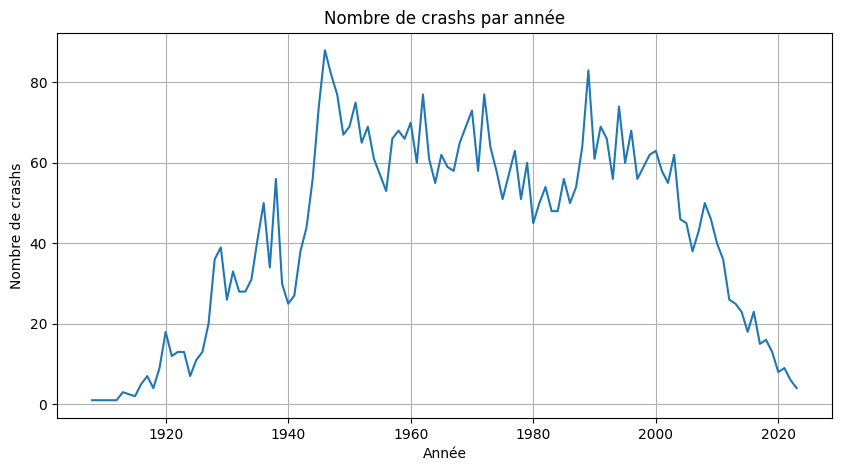

In [165]:
crashes_per_year.plot(kind="line", title="Nombre de crashs par année", figsize=(10, 5))
plt.xlabel("Année")
plt.ylabel("Nombre de crashs")
plt.grid(True)
plt.show()

Comment : marge decrease of the number if crashes per year after a relative peak in the 1990s.  

In [ ]:
# 3. Statistical Analysis:
    # Apply SciPy to analyze the distribution of fatalities and survival rates. Calculate key statistics like mean, median, and standard deviation.
    # Conduct a hypothesis test (e.g., comparing the average number of fatalities in different decades or regions).

!pip install pandas scipy

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import norm, f_oneway, binom, pearsonr, spearmanr
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import scipy.linalg as la

In [ ]:
# Chemin du fichier
chemin_fichier = 'Airplane_Crashes_and_Fatalities_Since_1908_t0_2023.csv'

# Tentative avec différents encodages
try:
    # Essai avec 'latin-1'
    df = pd.read_csv(chemin_fichier, encoding='latin-1')
except:
    try:
        # Essai avec 'iso-8859-1'
        df = pd.read_csv(chemin_fichier, encoding='iso-8859-1')
    except:
        try:
            # Essai avec 'cp1252'
            df = pd.read_csv(chemin_fichier, encoding='cp1252')
        except Exception as e:
            print(f"Erreur lors de la lecture du fichier : {e}")

In [ ]:
    # Descriptive statistics :
        # Mean, median, std for fatalities 
mean_fatalities = df['Fatalities'].mean()
median_fatalities = df['Fatalities'].median()
std_fatalities = df['Fatalities'].std()

print(f"Fatalities – Mean: {mean_fatalities:.2f}, Median: {median_fatalities}, Std Dev: {std_fatalities:.2f}")


Fatalities – Mean: 22.37, Median: 11.0, Std Dev: 35.06


Comments : quite surprising low mean and median, even if a lot of crashes might concern small planes.

In [156]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Date                   4998 non-null   object 
 1   Time                   3486 non-null   object 
 2   Location               4994 non-null   object 
 3   Operator               4988 non-null   object 
 4   Flight #               1329 non-null   object 
 5   Route                  4221 non-null   object 
 6   AC Type                4983 non-null   object 
 7   Registration           4724 non-null   object 
 8   cn/ln                  4330 non-null   object 
 9   Aboard                 4980 non-null   float64
 10  Aboard Passangers      4769 non-null   float64
 11  Aboard Crew            4772 non-null   float64
 12  Fatalities             4990 non-null   float64
 13  Fatalities Passangers  4756 non-null   float64
 14  Fatalities Crew        4757 non-null   float64
 15  Grou

In [161]:
from scipy.stats import pearsonr
	# Calculate Pearson Correlation between Fatalities Passangers and Fatalities Crew
corr, _ = pearsonr(data['Fatalities'], data['Aboard'])
print(f'Pearson Correlation Coefficient: {corr:.2f}')

Pearson Correlation Coefficient: 0.03


In [107]:
print(df.columns)

Index(['Date', 'Time', 'Location', 'Operator', 'Flight #', 'Route', 'AC Type',
       'Registration', 'cn/ln', 'Aboard', 'Aboard Passangers', 'Aboard Crew',
       'Fatalities', 'Fatalities Passangers', 'Fatalities Crew', 'Ground',
       'Summary'],
      dtype='object')


In [ ]:
        # Mean, median, std for survival rates
df['Survived'] = df['Aboard'] - df['Fatalities']

total_crashes = len(df)
total_aboard = df["Aboard"].sum()
total_fatalities = df["Fatalities"].sum()
total_survivors = df["Survived"].sum()
total_survival_rate = (total_survivors / total_aboard) * 100

print(f"Total Crashes: {total_crashes}")
print(f"Total Aboard: {total_aboard}")
print(f"Total Fatalities: {total_fatalities}")
print(f"Total Survived: {total_survivors}")
print(f"Overall Survival Rate: {total_survival_rate:.2f}%")

Total Crashes: 4998
Total Aboard: 155356.0
Total Fatalities: 111644.0
Total Survived: 43795.0
Overall Survival Rate: 28.19%


In [ ]:
Comment : 
- With 4998 crashes, and 155536 passengers and crew onboaed, the database is of significant size, which means the data are rather telling.
- the 28% survival rate is extremely significant. It's quite questionning to have 43000+ survivors all together.

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
crashes_per_year.plot(kind='bar', color='skyblue')
plt.title("Number of Crashes per Year")
plt.xlabel("Year")
plt.ylabel("Number of Crashes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [129]:
#4. Hypothesis testing
        # compare the 1910-1920 fatality mean between with 1920-1930

df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Decade'] = (df['Year'] // 10) * 10  # ex: 1995 devient 1990

# Filter per decade :
group1 = df[df['Decade'] == '1910s']['Fatalities']
group2 = df[df['Decade'] == '1920s']['Fatalities']

group1 = df[df['Decade'] == 1910]['Fatalities']



In [ ]:
    # Fatality rates comparison between two decades :
from scipy import stats

group1 = df[df['Decade'] == 1910]['Fatalities']
group2 = df[df['Decade'] == 1920]['Fatalities']

t_stat, p_val = stats.ttest_ind(group1.dropna(), group2.dropna(), equal_var=False)
print(f"T-test (1910 vs 1920): t = {t_stat:.2f}, p = {p_val:.4f}")

T-test (1910 vs 1920): t = 5.57, p = 0.0000


Comment :
- the high T-test value (t = 5.57) is highlighting large differences between the 2 series.

In [132]:
    # Compare average fatalities on all the decades (ANOVA)

anova_data = [df[df['Decade'] == d]['Fatalities'].dropna() for d in sorted(df['Decade'].unique())]
f_stat, p_val = stats.f_oneway(*anova_data)
print(f"ANOVA: F = {f_stat:.2f}, p = {p_val:.4f}")

ANOVA: F = 23.20, p = 0.0000


Comment :
- p = 0, which means that the probability of observing such data if the null hypothesis were true is extremely low. Consequently, we reject the null hypothesis and conclude that there are significant differences among the group means. Which is rather logical.

In [ ]:
# Make sure 'Aboard' and 'Fatalities' columns are numerical :
df['Aboard'] = pd.to_numeric(df['Aboard'], errors='coerce')
df['Fatalities'] = pd.to_numeric(df['Fatalities'], errors='coerce')

# Create 'Survived' category from the two others :
df['Survived'] = df['Aboard'] - df['Fatalities']
#NB : errors='coerce' will transform non valid data (text, void) into NaN as to prevent from calculation errors.

print("Aboard =", df['Aboard'].tolist())
print("Fatalities =", df['Fatalities'].tolist())
print("Survived =", df['Survived'].tolist())

Aboard = [2.0, 1.0, 5.0, 1.0, 20.0, 30.0, 41.0, 19.0, 20.0, 22.0, 19.0, 28.0, 20.0, 20.0, 23.0, 21.0, 24.0, 16.0, 18.0, 18.0, 23.0, 22.0, 19.0, 1.0, 1.0, 1.0, nan, 14.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 2.0, 2.0, 1.0, 1.0, 8.0, 1.0, 1.0, 3.0, 2.0, 1.0, 2.0, 1.0, 1.0, 1.0, 2.0, 46.0, 5.0, 2.0, 5.0, 45.0, 6.0, 7.0, 17.0, 3.0, 3.0, 5.0, 3.0, 1.0, 4.0, 2.0, 1.0, 4.0, 1.0, 1.0, 1.0, 6.0, 11.0, 2.0, 1.0, 5.0, 5.0, 1.0, 52.0, 1.0, 1.0, 3.0, 5.0, 1.0, 1.0, 1.0, 8.0, 5.0, 3.0, 4.0, 2.0, 1.0, 1.0, 43.0, nan, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 6.0, 2.0, 5.0, 15.0, 5.0, 7.0, 4.0, 12.0, 3.0, 1.0, 0.0, 1.0, 3.0, 1.0, 2.0, 1.0, 3.0, 5.0, 11.0, 1.0, 12.0, 3.0, 6.0, 2.0, 4.0, 1.0, 6.0, 1.0, 1.0, 5.0, 3.0, 2.0, 1.0, 2.0, 1.0, 2.0, 2.0, 2.0, 9.0, 5.0, 2.0, 5.0, 5.0, 1.0, 6.0, 6.0, 6.0, 7.0, 5.0, 2.0, 7.0, 3.0, 3.0, 1.0, 2.0, 3.0, 3.0, 1.0, 1.0, 5.0, 14.0, 5.0, 4.0, 1.0, 4.0, 3.0, 1.0, 1.0, 9.0, 2.0, 1.0, 15.0, 4.0, 6.0, 5.0, 2.0, 6.0, 5.0, 2.0, 13.0, 8.0, 5.

In [163]:
from scipy import stats
# Sample data from three different groups
Survivors = df['Survived'] 
Aboard = df['Aboard'] 
Fatalities = df['Fatalities'] 
# Performing one-way ANOVA
f_value, p_value = stats.f_oneway(Survivors, Aboard, Fatalities)
print("F-value:", f_value)
print("P-value:", p_value)


F-value: nan
P-value: nan


Comment : ackward result "nan", which I can't explain.

In [ ]:
    # Compare survival rates per decade :

df['Survived'] = df['Aboard'] - df['Fatalities']
df['Survival Rate'] = df['Survived'] / df['Aboard']

survival_by_decade = df.groupby('Decade')['Survival Rate'].mean()
print(survival_by_decade)

In [ ]:
    # Selected plots :
        # Average evolution plot of fatalities per decade 
df.groupby('Decade')['Fatalities'].mean().plot(kind='line', marker='o', title='Average Fatalities by Decade')
plt.ylabel('Average Fatalities')
plt.grid(True)
plt.show()

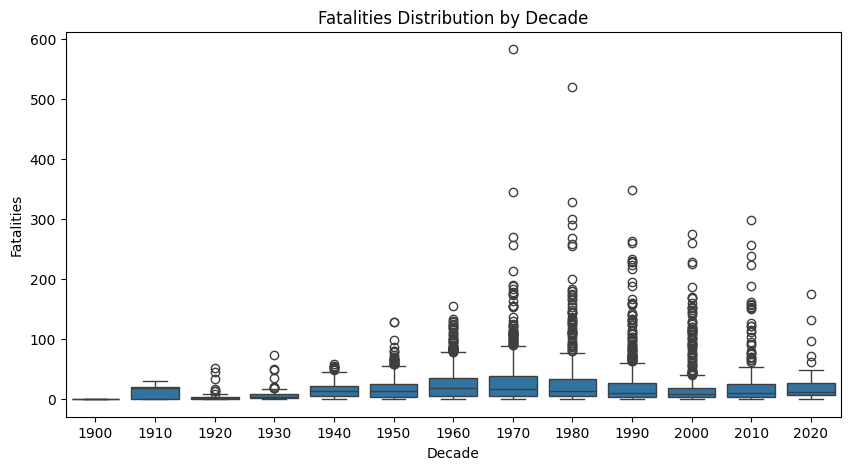

In [155]:
        # Boxplot per decade 
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.boxplot(x='Decade', y='Fatalities', data=df)
plt.title('Fatalities Distribution by Decade')
plt.show()

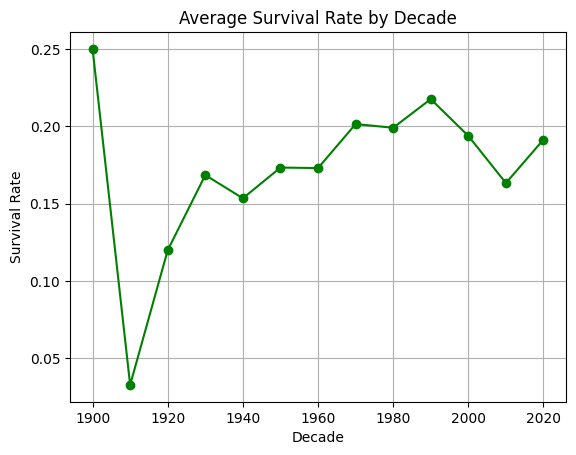

In [ ]:
        # Survival rate curb per decade :
df.groupby('Decade')['Survival Rate'].mean().plot(kind='line', marker='o', color='green')
plt.title("Average Survival Rate by Decade")
plt.ylabel("Survival Rate")
plt.grid(True)
plt.show()

In [ ]:
    # Location crash analysis :
crashes_by_location_year = df.groupby(["Location", "Year"]) \
    .size().unstack(fill_value=0)

In [154]:
# Visualization
crashes_by_location_year.T.plot(
    kind="bar", stacked=True, figsize=(15, 6), colormap="tab20"
)
plt.title("Nombre de crashs par lieu et par année")
plt.xlabel("Année")
plt.ylabel("Nombre de crashs")
plt.legend(title="Lieu", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

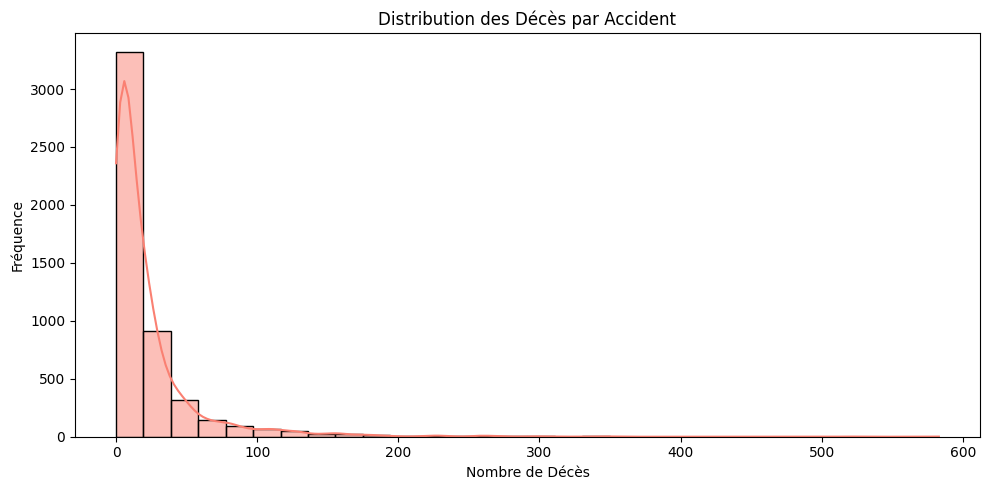

In [153]:
import matplotlib.pyplot as plt
import seaborn as sns

# Fatalities histogram :
plt.figure(figsize=(10, 5))
sns.histplot(df["Fatalities"], bins=30, kde=True, color="salmon")
plt.title("Distribution des Décès par Accident")
plt.xlabel("Nombre de Décès")
plt.ylabel("Fréquence")
plt.tight_layout()
plt.show()


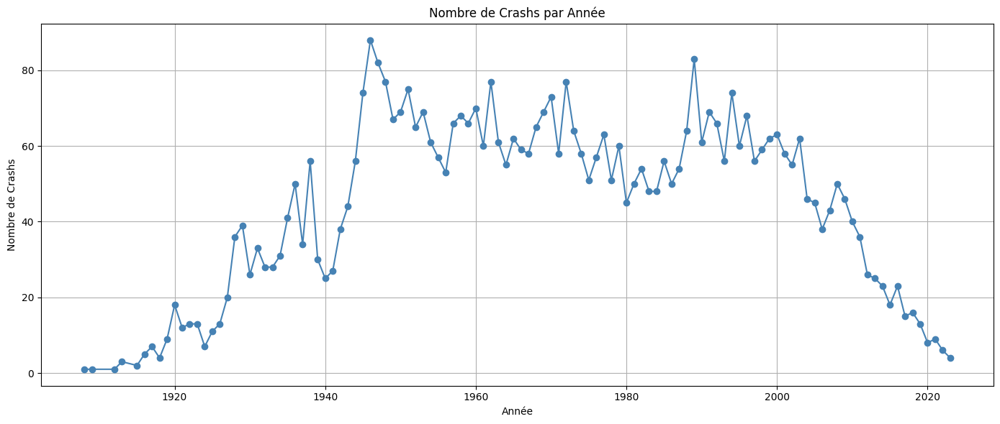

In [139]:
# Crash evolution througout the years :
crashes_per_year = df.groupby("Year").size()

plt.figure(figsize=(14, 6))
crashes_per_year.plot(kind="line", marker="o", color="steelblue")
plt.title("Nombre de Crashs par Année")
plt.xlabel("Année")
plt.ylabel("Nombre de Crashs")
plt.grid(True)
plt.tight_layout()
plt.show()


In [142]:
df['Survived'] = df['Aboard'] - df['Fatalities']
df['Survival Rate'] = df['Survived'] / df['Aboard']

survival_rate_by_year = df.groupby('Decade')['Survival Rate'].mean()
print(survival_rate_by_year)

Decade
1900    0.250000
1910    0.032708
1920    0.119869
1930    0.168412
1940    0.153404
1950    0.173275
1960    0.172948
1970    0.201392
1980    0.199029
1990    0.217563
2000    0.193734
2010    0.163262
2020    0.191380
Name: Survival Rate, dtype: float64


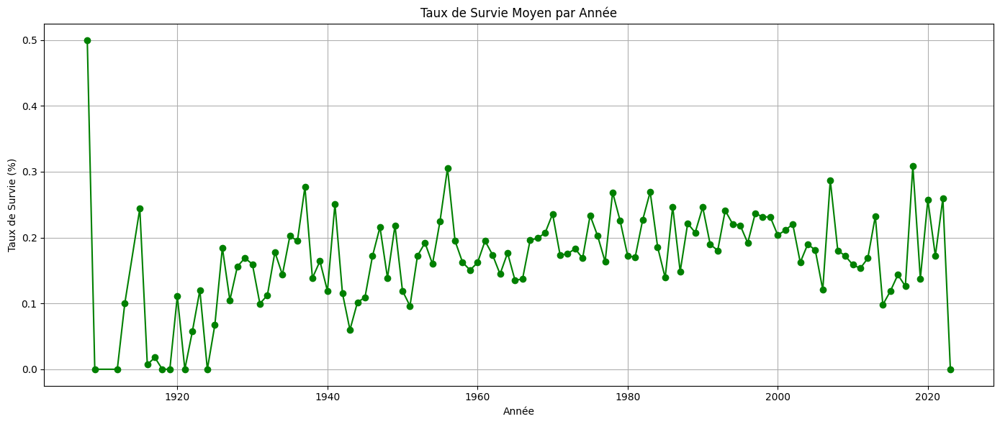

In [144]:
# Survival rate per year :
survival_rate_by_year = df.groupby("Year")["Survival Rate"].mean()

plt.figure(figsize=(14, 6))
survival_rate_by_year.plot(kind="line", marker="o", color="green")
plt.title("Taux de Survie Moyen par Année")
plt.xlabel("Année")
plt.ylabel("Taux de Survie (%)")
plt.grid(True)
plt.tight_layout()
plt.show()

WK4_DAY3_DAILY_CHALLENGE

Daily Challenge: Analysis of Airplane Crashes and Fatalities


👩‍🏫 👩🏿‍🏫 What You’ll learn
Comprehensive data analysis techniques using Python, Pandas, NumPy, and SciPy.
Methods for data cleaning, exploratory analysis, statistical testing, and visualization.
Insightful interpretation of complex datasets.


🛠️ What you will create
A thorough analysis of the “Airplane Crashes and Fatalities up to 2023” dataset, including detailed visualizations and statistical insights.


Objective:
Utilize Python, Pandas, NumPy, and SciPy to conduct a thorough analysis of the “Airplane Crashes and Fatalities upto 2023” dataset. This challenge will encompass data cleaning, exploratory analysis, statistical testing, and visualization to draw meaningful insights.



Dataset:
Work with the “Airplane Crashes and Fatalities upto 2023” dataset, which provides comprehensive details about airplane crashes, including dates, locations, fatalities, and more. Access the dataset here.

Tasks:
1. Data Import and Cleaning:
Import the dataset using Pandas.
Clean and preprocess the data, addressing missing values and categorizing data as needed.
Convert dates and other relevant fields to appropriate formats.

2. Exploratory Data Analysis:
Use Pandas to explore basic statistics such as the number of crashes, fatalities, and survival rates.
Analyze the frequency of crashes over time to identify any trends.

3. Statistical Analysis:
Apply SciPy to analyze the distribution of fatalities and survival rates. Calculate key statistics like mean, median, and standard deviation.
Conduct a hypothesis test (e.g., comparing the average number of fatalities in different decades or regions).

4. Visualization:
Create charts and graphs using Matplotlib and Seaborn to visualize the findings from your exploratory data analysis and statistical tests.
Examples might include time series plots of crashes over years, bar charts of crashes by region, and histograms of fatalities.

5. Insight and Report:
Summarize your findings and provide insights into the patterns or anomalies discovered in the data.
Prepare a well-structured report including all code, visualizations, and interpretations.

Submission:
You should submit a comprehensive report encompassing their code, analysis, and visualizations. Articulate how you have applied NumPy, Pandas, and SciPy in your analysis, highlighting any significant patterns or insights discovered in the dataset.